<a href="https://colab.research.google.com/github/greengerong/awesome-llm/blob/main/colab/sdxl/hidiffusion_colab_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 环境依赖

In [2]:
!cd /content
!pip install -q hidiffusion==0.1.4
!pip install -q diffusers==0.25.0 transformers==4.27.4 accelerate==0.18.0 xformers==0.0.16rc425

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 36.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.3/215.3 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 MB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 105.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.5/887.5 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 70.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.1/557.1 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.1/317.1 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 70.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.

# 文生图任务

## pipeline初始化

In [3]:
from hidiffusion import apply_hidiffusion, remove_hidiffusion
from diffusers import StableDiffusionXLPipeline, DDIMScheduler
import torch

pretrain_model = "stabilityai/stable-diffusion-xl-base-1.0"
scheduler = DDIMScheduler.from_pretrained(pretrain_model, subfolder="scheduler")
pipe = StableDiffusionXLPipeline.from_pretrained(pretrain_model, scheduler = scheduler, torch_dtype=torch.float16, variant="fp16").to("cuda")
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_vae_tiling()

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## 一行代码应用hidiffusion

In [4]:
# Apply hidiffusion with a single line of code.
apply_hidiffusion(pipe)

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.25.0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

## 高分辨率文生图 - 01

  0%|          | 0/50 [00:00<?, ?it/s]

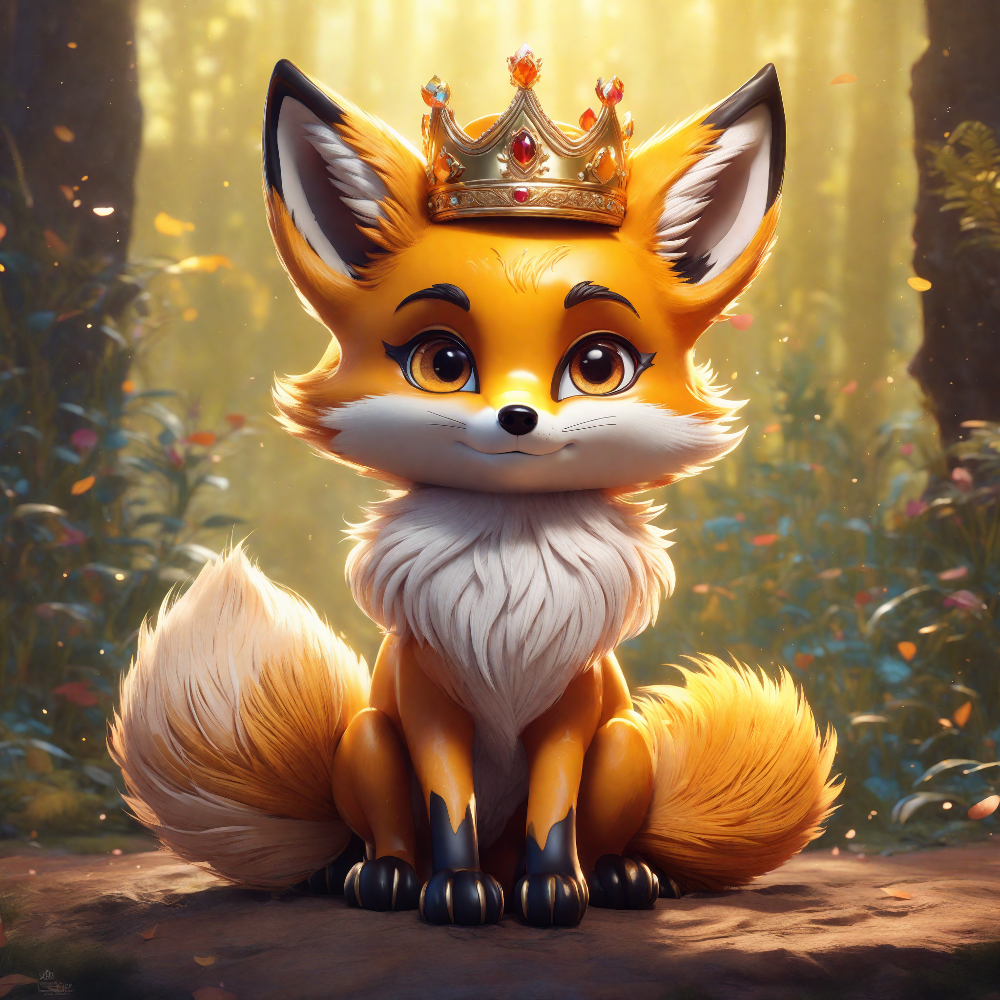

In [ ]:
prompt = "thick strokes, golden crown, bright colors, an exotic fox, cute, chibi kawaii. detailed fur, hyperdetailed , big reflective eyes, fairytale, artstation,centered composition, perfect composition, centered, vibrant colors, muted colors, high detailed, 8k."
negative_prompt = "blurry, ugly, duplicate, poorly drawn, deformed, mosaic"
image = pipe(prompt, guidance_scale=7.5, height=2048, width=2048, eta=1.0, negative_prompt=negative_prompt).images[0]
image

## 高分辨率文生图 - 02

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['euve, gil elvgren, alberto vargas, earl moran, enoch bolles.']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['euve, gil elvgren, alberto vargas, earl moran, enoch bolles.']


  0%|          | 0/50 [00:00<?, ?it/s]

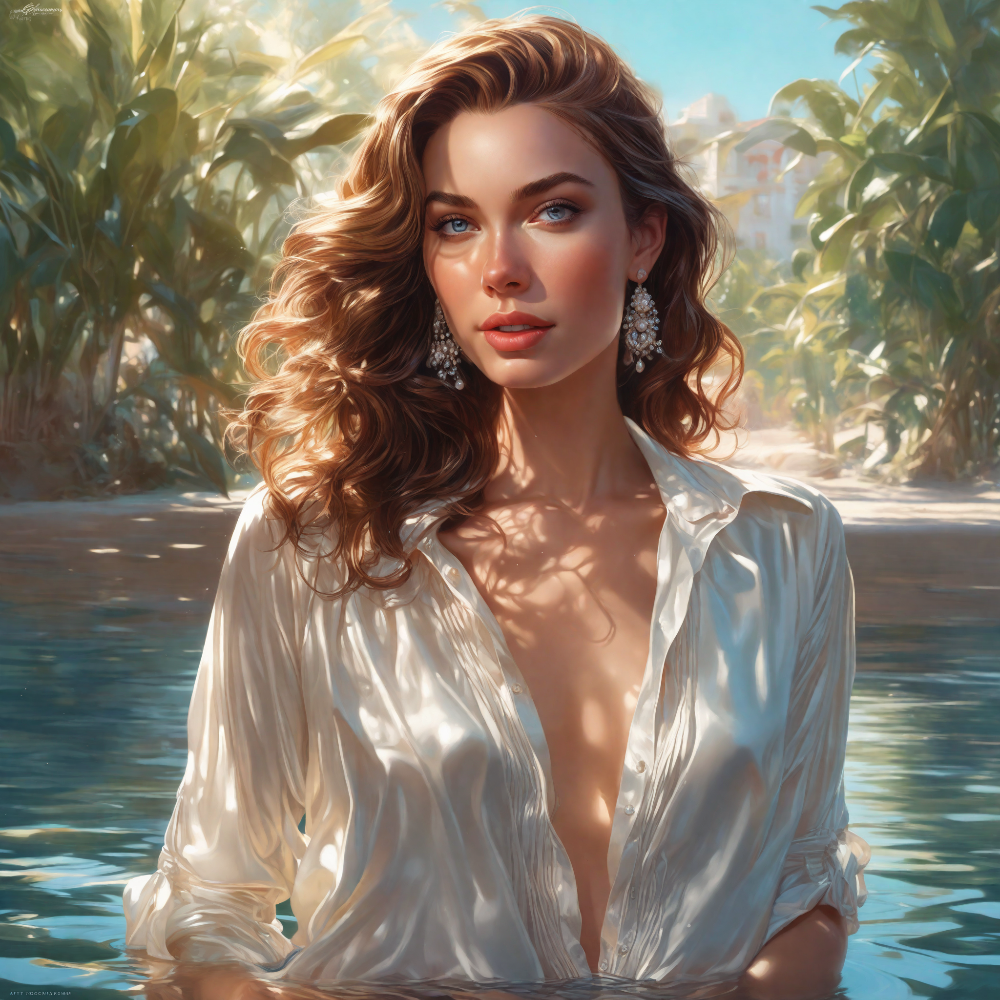

In [8]:
prompt = "Glamorous and sexy wet Rena Rounen aka Nano in sumptuous blouse, sfw, beautiful, pearlescent skin, natural beauty, seductive eyes and face, elegant girl, natural beauty, very detailed face, seductive lady, full body portrait, natural lights, photorealism, summer vibrancy, cinematic, a portrait by artgerm, rossdraws, Norman Rockwell, magali villeneuve, Gil Elvgren, Alberto Vargas, Earl Moran, Enoch Bolles."
negative_prompt = "nsfw,blurry, ugly, duplicate, poorly drawn, deformed, mosaic,text,Watermark"
image = pipe(prompt, guidance_scale=7.5, height=2048, width=2048, eta=1.0, negative_prompt=negative_prompt).images[0]
image

## 高分辨率文生图 - 03

  0%|          | 0/50 [00:00<?, ?it/s]

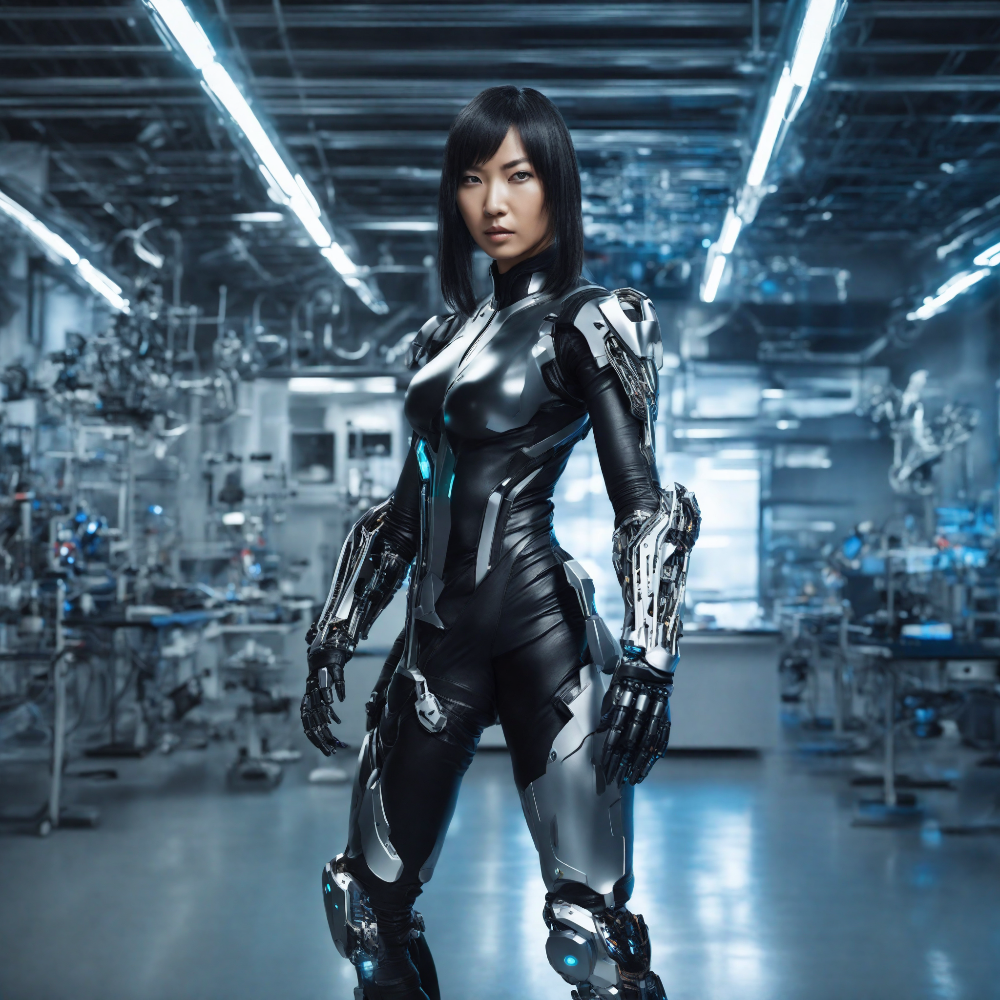

In [7]:
prompt = "cybernetic style A female fighter standing on the floor in a laboratory , gloves, Asian girl, futuristic, technological, cybernetic enhancements, robotics, artificial intelligence themes"
negative_prompt = "nsfw,blurry, ugly, duplicate, poorly drawn, deformed, mosaic,text,Watermark"
image = pipe(prompt, guidance_scale=7.5, height=2048, width=2048, eta=1.0, negative_prompt=negative_prompt).images[0]
image